# **Redes Siamesas**


In [1]:
!pip install pytorch-metric-learning

# **1. Descargamos la data**

## Organizamos los datos para este formato.
```
data/
 └── dataset_organized/
      ├── train/
      │     ├── Abyssinian/
      │     │      ├── image_1.jpg
      │     │      ├── image_2.jpg
      │     │      ...
      │     └── beagle/
      │            ├── ...
      ├── val/
      │     ├── Abyssinian/
      │     ├── beagle/
      │     └── ...
      └── test/
            ├── Abyssinian/
            ├── beagle/
            └── ...

```



In [3]:
import glob

len(glob.glob("Data/Train/**/*.jpg", recursive=True))

1751

In [4]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def show_random_samples_per_class(base_path, split="train", seed=42, img_size=(300, 300)):
    """
    Muestra una muestra aleatoria por clase del split especificado.
    Escala las imágenes a un tamaño fijo (por defecto 300x300 píxeles).

    Parámetros:
    -----------
    base_path : str
        Ruta base del dataset organizado (ej. 'data/dataset_organized')
    split : str
        Conjunto a visualizar ('train', 'val' o 'test')
    seed : int
        Semilla aleatoria para reproducibilidad
    img_size : tuple
        Tamaño (ancho, alto) al que escalar las imágenes antes de mostrarlas
    """
    random.seed(seed)

    # --- Ruta del split ---
    split_path = os.path.join(base_path, split)
    if not os.path.exists(split_path):
        raise ValueError(f"No existe la carpeta: {split_path}")

    # --- Clases ---
    class_names = sorted(os.listdir(split_path))
    n_classes = len(class_names)
    print(f"📂 Split: {split} — {n_classes} clases encontradas")

    # --- Seleccionar una imagen aleatoria por clase ---
    samples = []
    for cls in class_names:
        cls_dir = os.path.join(split_path, cls)
        imgs = [f for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg', '.png'))]
        if not imgs:
            continue
        img_path = os.path.join(cls_dir, random.choice(imgs))
        samples.append((img_path, cls))

    # --- Tamaño de figura dinámico ---
    n_cols = 8
    n_rows = min(6, (len(samples) + n_cols - 1) // n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 14))
    axes = axes.flatten()

    # --- Mostrar imágenes escaladas ---
    for ax, (img_path, cls) in zip(axes, samples):
        img = Image.open(img_path).convert("RGB")
        img = img.resize(img_size, Image.Resampling.LANCZOS)  # escalado con alta calidad
        ax.imshow(img)
        ax.set_title(cls, fontsize=9)
        ax.axis("off")

    # Desactivar ejes vacíos
    for ax in axes[len(samples):]:
        ax.axis("off")

    plt.suptitle(f"Muestras aleatorias del split: {split}", fontsize=14, y=0.95)
    plt.tight_layout()
    plt.show()


📂 Split: train — 20 clases encontradas


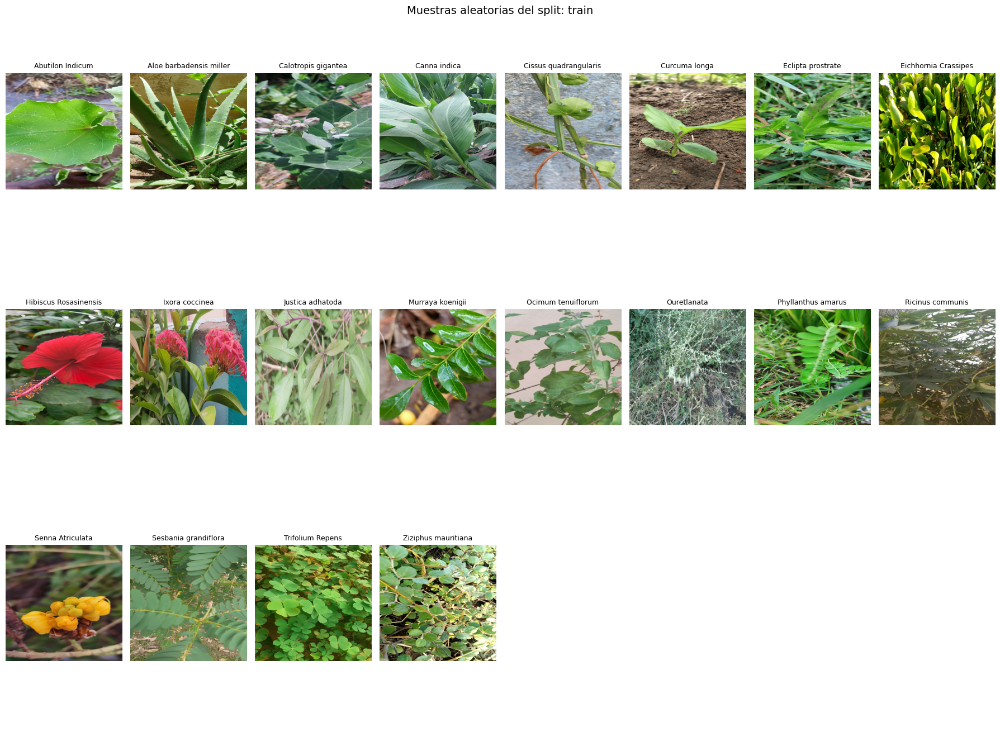

📂 Split: val — 20 clases encontradas


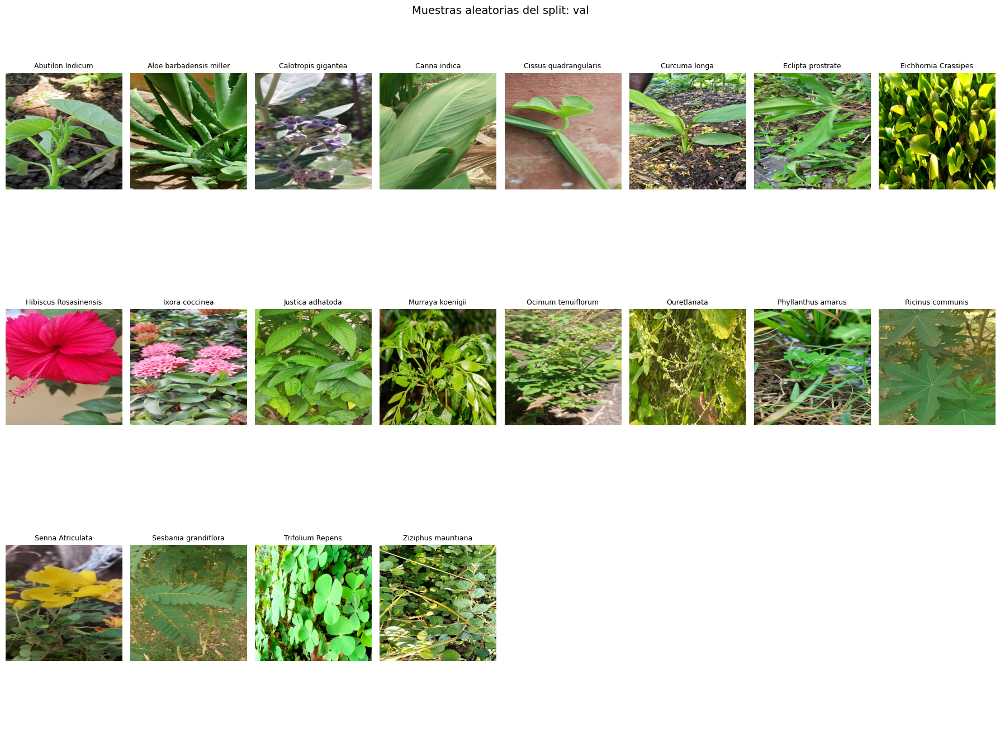

📂 Split: test — 20 clases encontradas


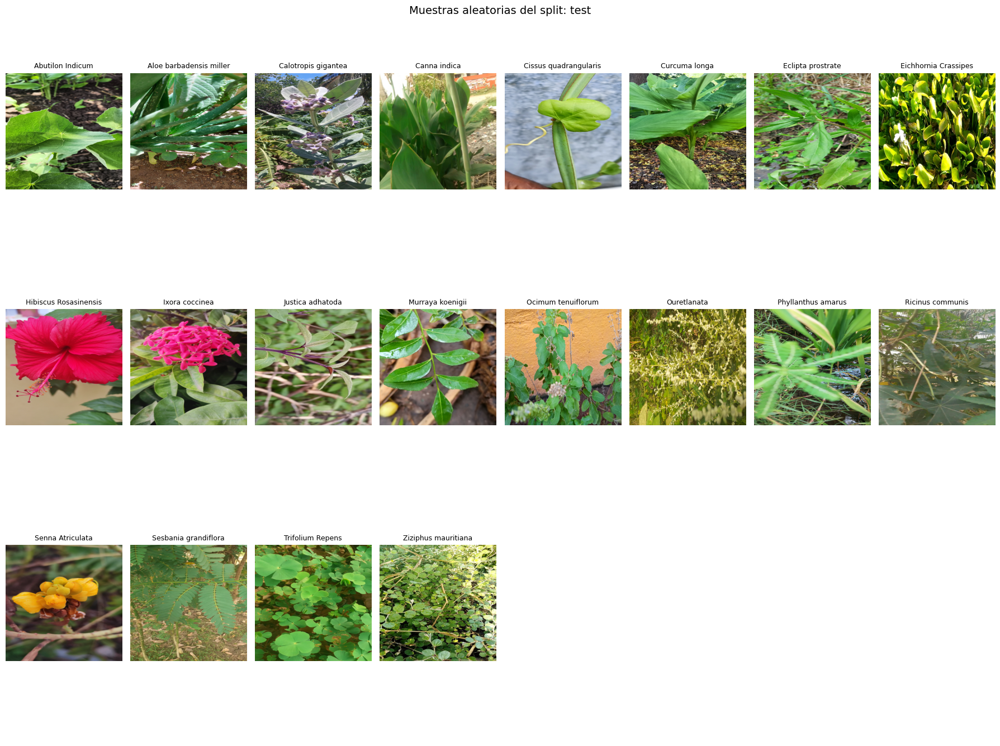

In [5]:
# Visualizar una muestra por clase en el conjunto de entrenamiento
show_random_samples_per_class("Data", split="train")
# O para validación o test
show_random_samples_per_class("Data", split="val")
show_random_samples_per_class("Data", split="test")


# **1. Generando DataLoaders**

In [6]:
pip install pytorch-lightning

Note: you may need to restart the kernel to use updated packages.


In [7]:
!pip install git+https://github.com/rwightman/pytorch-image-models.git

  Cloning https://github.com/rwightman/pytorch-image-models.git to c:\users\i21328\appdata\local\temp\pip-req-build-118sxv6x
  Resolved https://github.com/rwightman/pytorch-image-models.git to commit ae4d1bbfefab7e4f2f49a744838a2d9c7713146d
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/rwightman/pytorch-image-models.git 'C:\Users\i21328\AppData\Local\Temp\pip-req-build-118sxv6x'


In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from pytorch_metric_learning.losses import TripletMarginLoss
from pytorch_metric_learning.miners import TripletMarginMiner
from pytorch_metric_learning.samplers import MPerClassSampler


In [10]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from pytorch_metric_learning.samplers import MPerClassSampler
import pytorch_lightning as pl

class PlantsDataModule(pl.LightningDataModule):
    """
    DataModule para el dataset SIMPD V1 (o cualquier dataset tipo ImageFolder)
    organizado en /train /val /test.
    Compatible con contrastive / siamese / metric learning.
    """
    def __init__(self,
                 data_dir="Data",
                 batch_size=16,
                 num_workers=0,
                 m_per_class=4,
                 image_size=224):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.m_per_class = m_per_class
        self.image_size = image_size

    def setup(self, stage=None):

        transform_train = transforms.Compose([
            transforms.Resize((self.image_size, self.image_size)),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(10),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])

        transform_test = transforms.Compose([
            transforms.Resize((self.image_size, self.image_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])

        # Carga de datasets
        self.train_dataset = datasets.ImageFolder(f"{self.data_dir}/train", transform=transform_train)
        self.val_dataset   = datasets.ImageFolder(f"{self.data_dir}/val",   transform=transform_test)
        self.test_dataset  = datasets.ImageFolder(f"{self.data_dir}/test",  transform=transform_test)

    def _make_sampler(self, dataset):
        """Sampler balanceado por clase (útil en metric learning)."""
        labels = [y for _, y in dataset]
        return MPerClassSampler(labels, m=self.m_per_class, length_before_new_iter=len(dataset))

    def train_dataloader(self):
        sampler = self._make_sampler(self.train_dataset)
        return DataLoader(self.train_dataset,
                          batch_size=self.batch_size,
                          sampler=sampler,
                          num_workers=self.num_workers)

    def val_dataloader(self):
        sampler = self._make_sampler(self.val_dataset)
        return DataLoader(self.val_dataset,
                          batch_size=self.batch_size,
                          sampler=sampler,
                          num_workers=self.num_workers)

    def test_dataloader(self):
        sampler = self._make_sampler(self.test_dataset)
        return DataLoader(self.test_dataset,
                          batch_size=self.batch_size,
                          sampler=sampler,
                          num_workers=self.num_workers)


In [11]:
# Instanciar y preparar
dm = PlantsDataModule(
    data_dir="Data",
    batch_size=16,
    m_per_class=4,
    image_size=224
)
dm.setup()

In [12]:

# Comprobación rápida
batch = next(iter(dm.train_dataloader()))
print("Batch imágenes:", batch[0].shape)
print("Batch etiquetas:", batch[1][:50])

Batch imágenes: torch.Size([16, 3, 224, 224])
Batch etiquetas: tensor([ 6,  6,  6,  6,  2,  2,  2,  2,  0,  0,  0,  0, 17, 17, 17, 17])


# **2. Creando el modelo**

In [13]:
import torch
import timm
import torch.nn as nn
import torch.nn.functional as F

class SiameseNet(nn.Module):
    def __init__(self, embedding_dim=128, backbone_name="resnet200d", pretrained=True):
        super(SiameseNet, self).__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=pretrained, num_classes=0)
        in_features = self.backbone.num_features


        # Proyección al espacio de embeddings
        self.embedding = nn.Sequential(
            nn.Linear(in_features, embedding_dim, bias=False),
            nn.BatchNorm1d(embedding_dim)
        )

        # Inicialización
        self._init_weights()

    def _init_weights(self):
        for m in self.embedding.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, nonlinearity='linear')
            elif isinstance(m, nn.BatchNorm1d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        """
        Forward: recibe un batch de imágenes y devuelve embeddings normalizados (L2).
        """
        feats = self.backbone(x)           # Extrae características del backbone
        emb = self.embedding(feats)        # Proyección al espacio de embeddings
        emb = F.normalize(emb, p=2, dim=1) # Normalización L2 para comparaciones de distancia
        return emb


In [14]:
# Crear modelo siamesa
model = SiameseNet(embedding_dim=128)

# Obtener batch del DataModule
#dm = OxfordPetDataModule(data_dir="data/dataset_organized", batch_size=16, m_per_class=4)
#dm.setup()

imgs, labels = next(iter(dm.train_dataloader()))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
imgs = imgs.to(device)
labels = labels.to(device)
model = model.to(device)
emb = model(imgs)

print("Embeddings shape:", emb.shape)
print("Ejemplo:", emb[0][:10])

Embeddings shape: torch.Size([16, 128])
Ejemplo: tensor([ 0.0988, -0.0555, -0.0807,  0.1605, -0.0754,  0.0156, -0.0677, -0.0048,
         0.1340, -0.0915], device='cuda:0', grad_fn=<SliceBackward0>)


In [18]:
# Instanciar modelo
model = SiameseNet(embedding_dim=128, backbone_name="resnet200d", pretrained=True)

# Enviar a GPU si está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Prueba con un batch de imágenes (dummy)
x = torch.randn(8, 3, 224, 224).to(device)
embeddings = model(x)

print("Embeddings shape:", embeddings.shape)
print("Norma media:", embeddings.norm(dim=1).mean().item())

Embeddings shape: torch.Size([8, 128])
Norma media: 1.0


# **3. Entrenamiento**

In [19]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from tqdm import tqdm
import numpy as np

# =========================================================
# Funciones auxiliares
# =========================================================
def extract_embeddings(model, loader, device):
    """Extrae embeddings y etiquetas de un DataLoader."""
    model.eval()
    embs, labels = [], []
    with torch.no_grad():
        for imgs, labs in loader:
            imgs = imgs.to(device)
            emb = model(imgs).cpu()
            embs.append(emb)
            labels.append(labs)
    return torch.cat(embs), torch.cat(labels)

def plot_embeddings(embeddings, labels, title="Embeddings", n_classes=20, method="pca"):
    """Visualiza los embeddings en 2D usando PCA o t-SNE."""
    emb = embeddings.numpy()
    labs = labels.numpy()
    idx = np.arange(len(labs))

    # Reducir dimensionalidad
    if method.lower() == "tsne":
        reducer = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
    else:
        reducer = PCA(n_components=2)
    reduced = reducer.fit_transform(emb)

    # Tomar algunas clases aleatorias
    classes = np.unique(labs)
    if len(classes) > n_classes:
        classes = np.random.choice(classes, n_classes, replace=False)

    plt.figure(figsize=(10, 8))
    for cls in classes:
        mask = labs == cls
        plt.scatter(reduced[mask, 0], reduced[mask, 1], label=f"Clase {cls}", s=10, alpha=0.6)
    plt.title(title)
    plt.legend(markerscale=3, fontsize=8)
    plt.tight_layout()
    plt.show()

In [20]:
from pytorch_metric_learning.losses import ContrastiveLoss
from pytorch_metric_learning.miners import PairMarginMiner
def train_siamese_with_viz(
    model,
    datamodule,
    epochs=10,
    lr=1e-4,
    margin=0.2,
    visualize_method="pca",
    device="cuda" if torch.cuda.is_available() else "cpu",
    save_path="best_siamese.pt"
):
    model = model.to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

    # ==========================
    # ⭐ CAMBIO A CONTRASTIVE LOSS
    # ==========================
    from pytorch_metric_learning.losses import ContrastiveLoss
    from pytorch_metric_learning.miners import PairMarginMiner

    loss_fn = ContrastiveLoss(pos_margin=0.0, neg_margin=margin)
    miner = PairMarginMiner(pos_margin=0.0, neg_margin=margin)

    best_val = float("inf")

    for epoch in range(1, epochs + 1):
        model.train()
        running_loss = 0.0

        for imgs, labels in tqdm(datamodule.train_dataloader(), desc=f"Época {epoch}/{epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)

            emb = model(imgs)
            pairs = miner(emb, labels)  # ahora devuelve pares (pos/neg)
            loss = loss_fn(emb, labels, pairs)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        train_loss = running_loss / len(datamodule.train_dataloader())

        # =====================================
        # Validación
        # =====================================
        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for imgs, labels in datamodule.val_dataloader():
                imgs, labels = imgs.to(device), labels.to(device)

                emb = model(imgs)
                pairs = miner(emb, labels)
                loss = loss_fn(emb, labels, pairs)

                val_loss += loss.item()

        val_loss /= len(datamodule.val_dataloader())

        print(f"📘 Epoch [{epoch}/{epochs}] → Train: {train_loss:.4f} | Val: {val_loss:.4f}")

        if val_loss < best_val:
            best_val = val_loss
            torch.save(model.state_dict(), save_path)
            print(f"   ✅ Modelo mejorado guardado en {save_path}")

        emb, labs = extract_embeddings(model, datamodule.val_dataloader(), device)
        plot_embeddings(
            emb, labs,
            title=f"Embeddings en {visualize_method.upper()} — Epoch {epoch}",
            method=visualize_method,
            n_classes=20
        )


Época 1/10: 100%|██████████| 105/105 [02:21<00:00,  1.34s/it]


📘 Epoch [1/10] → Train: 0.9343 | Val: 0.6040
   ✅ Modelo mejorado guardado en best_siamese.pt


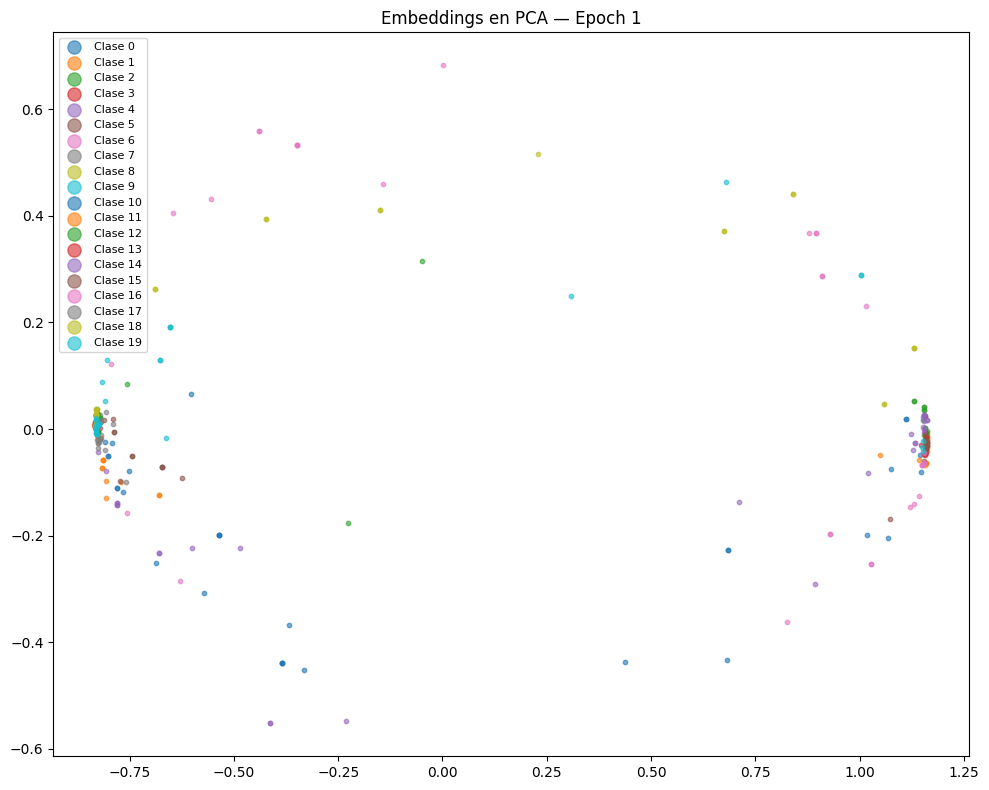

Época 2/10: 100%|██████████| 105/105 [02:36<00:00,  1.49s/it]


📘 Epoch [2/10] → Train: 0.5166 | Val: 0.5458
   ✅ Modelo mejorado guardado en best_siamese.pt


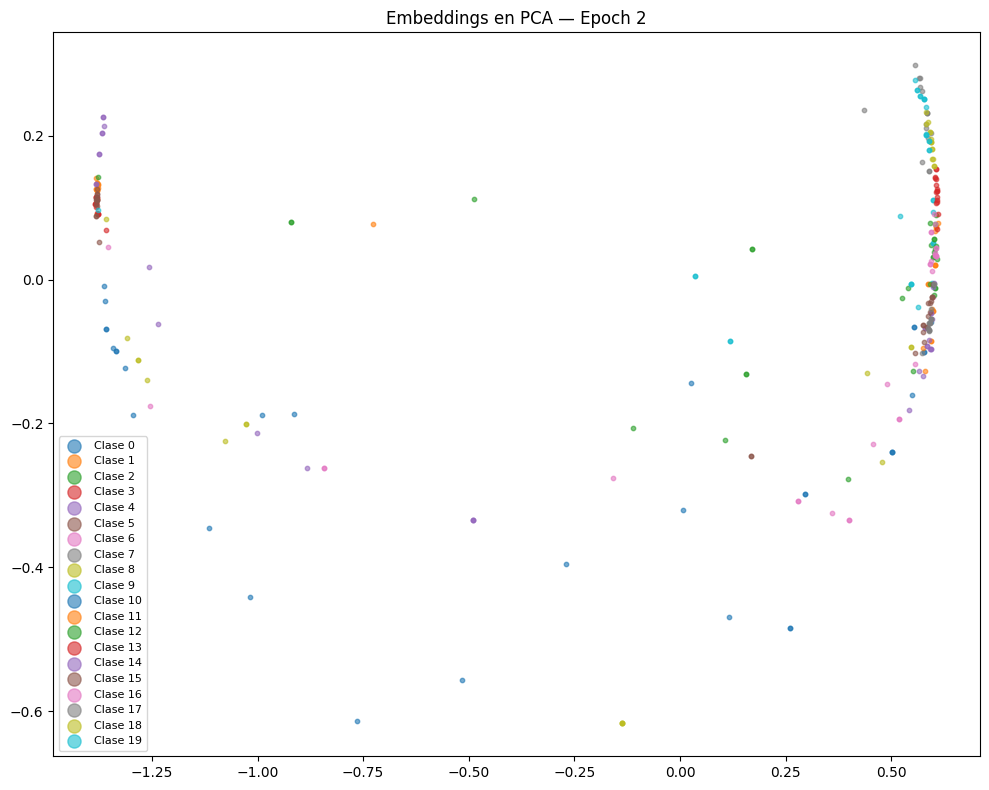

Época 3/10: 100%|██████████| 105/105 [02:33<00:00,  1.47s/it]


📘 Epoch [3/10] → Train: 0.4607 | Val: 0.4673
   ✅ Modelo mejorado guardado en best_siamese.pt


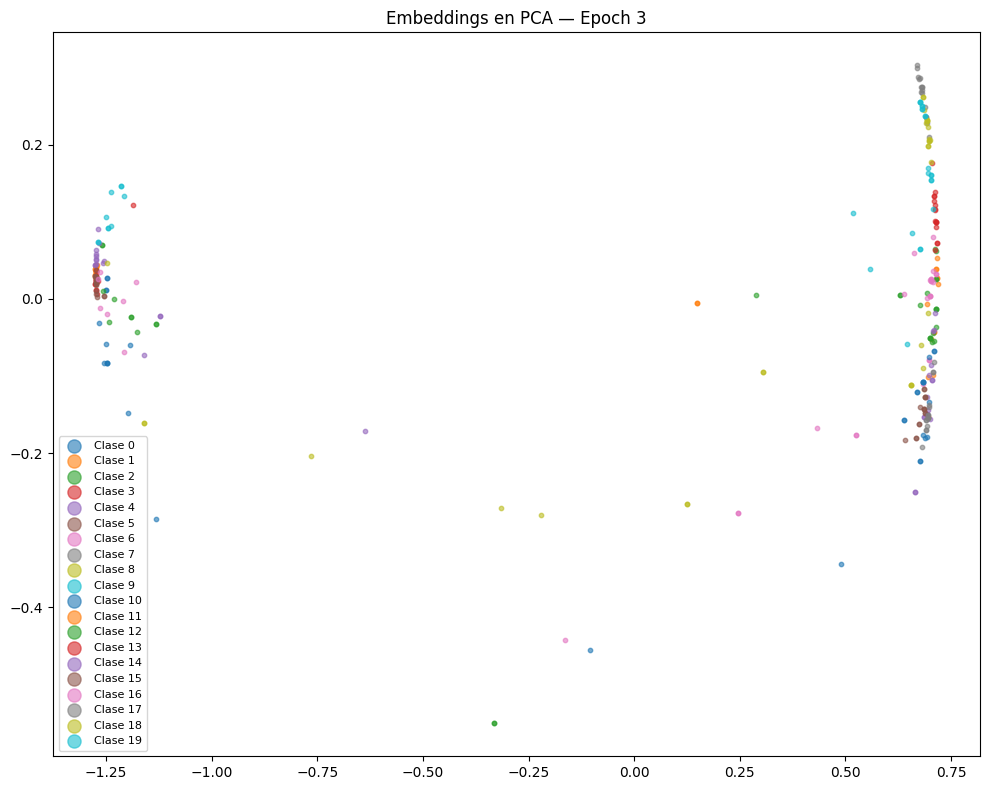

Época 4/10: 100%|██████████| 105/105 [02:23<00:00,  1.36s/it]


📘 Epoch [4/10] → Train: 0.3867 | Val: 0.3311
   ✅ Modelo mejorado guardado en best_siamese.pt


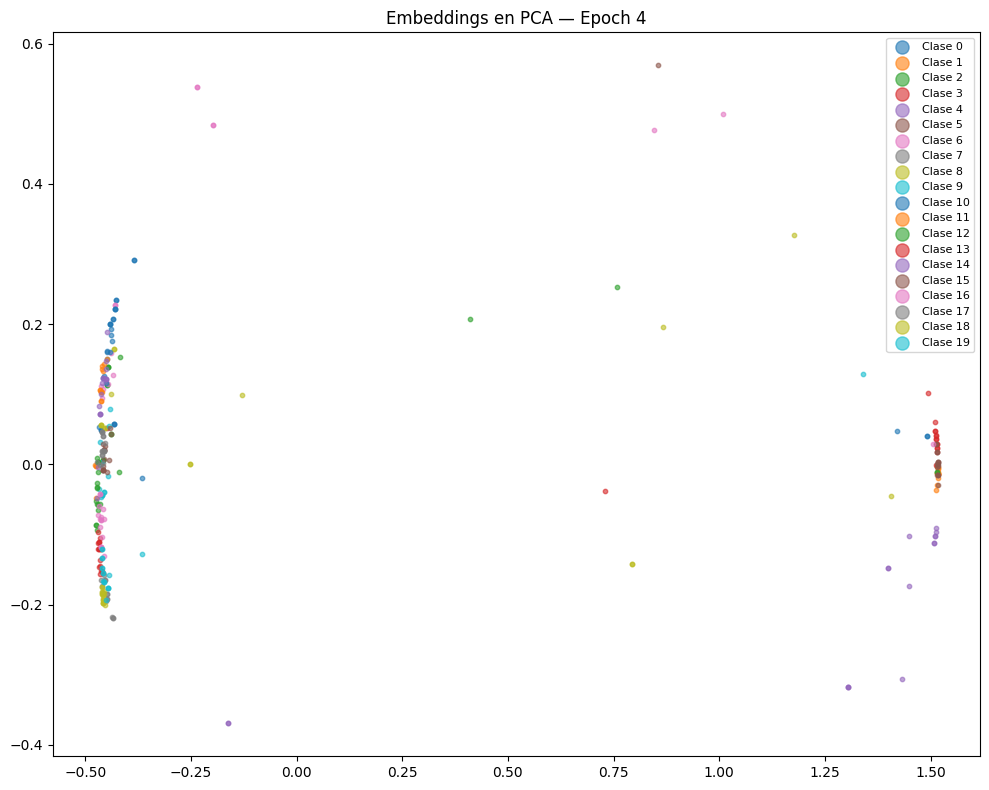

Época 5/10: 100%|██████████| 105/105 [02:21<00:00,  1.35s/it]


📘 Epoch [5/10] → Train: 0.3600 | Val: 0.3134
   ✅ Modelo mejorado guardado en best_siamese.pt


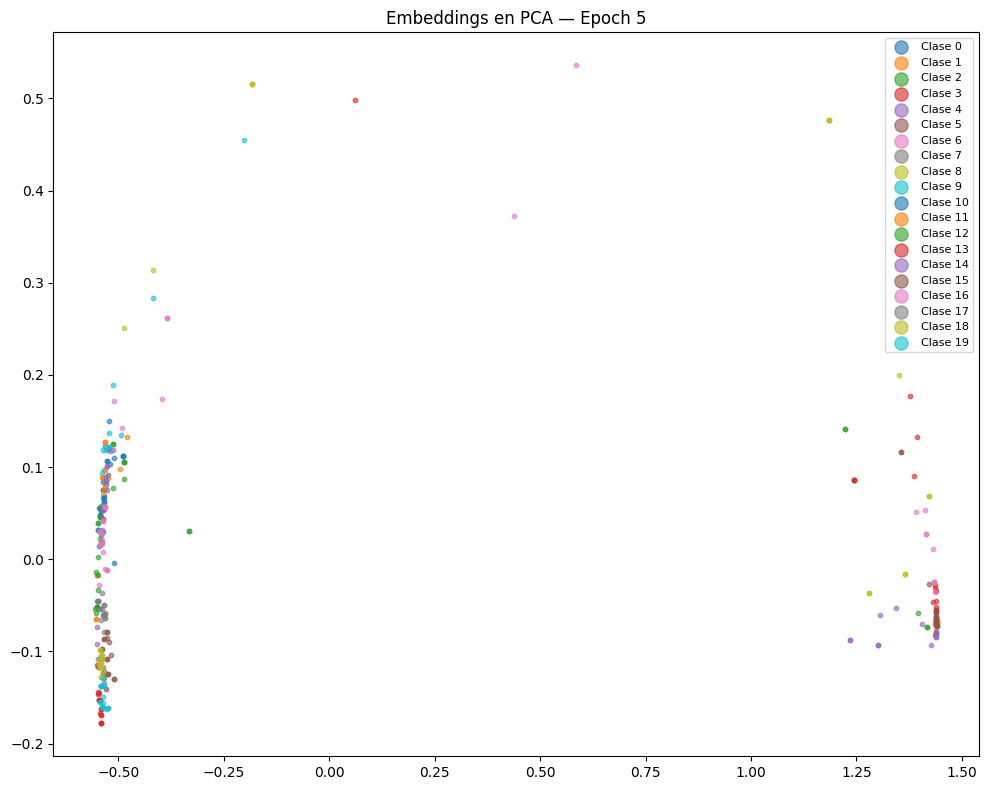

Época 6/10: 100%|██████████| 105/105 [02:21<00:00,  1.35s/it]


📘 Epoch [6/10] → Train: 0.3872 | Val: 0.3988


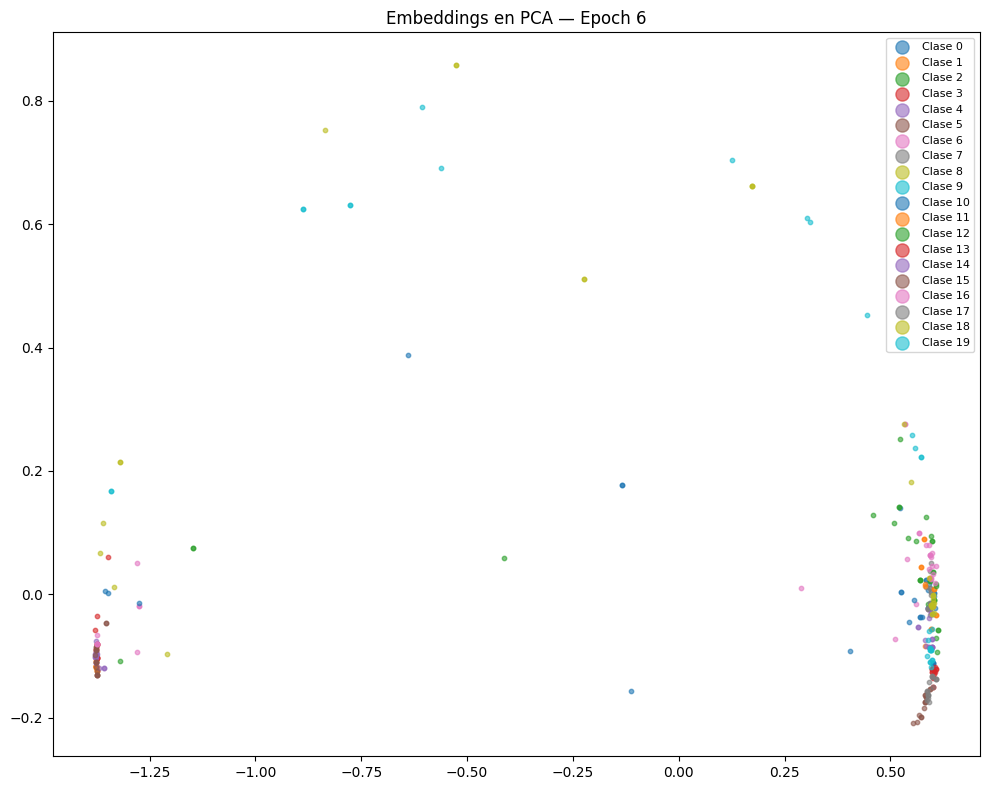

In [ ]:
# Instanciar DataModule
#dm = OxfordPetDataModule(
#    data_dir="data/dataset_organized",
#    batch_size=32,
#    m_per_class=4,
#    image_size=224
#)
#dm.setup()

# Crear modelo
model = SiameseNet(embedding_dim=128)

# Entrenar con visualización PCA por época
train_siamese_with_viz(
    model=model,
    datamodule=dm,
    epochs=10,
    lr=1e-4,
    visualize_method="pca"   # o "tsne" (más bonito pero más lento)
)


# **4. Pruebas**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

@torch.no_grad()
def test_siamese(model, datamodule, device=None, visualize_method="pca", k=5):
    """
    Evalúa el modelo siamesa en el conjunto de test:
      - Extrae embeddings
      - Visualiza el espacio de características
      - Calcula Accuracy con k-NN
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    print(f"🧪 Evaluando modelo en {device}...")

    # =========================================================
    # 1️⃣ Extraer embeddings del train y test
    # =========================================================
    print("→ Extrayendo embeddings del conjunto de entrenamiento...")
    train_emb, train_labels = extract_embeddings(model, datamodule.train_dataloader(), device)
    print("→ Extrayendo embeddings del conjunto de test...")
    test_emb, test_labels = extract_embeddings(model, datamodule.test_dataloader(), device)

    # =========================================================
    # 2️⃣ Visualizar embeddings del test
    # =========================================================
    plot_embeddings(
        test_emb, test_labels,
        title=f"Embeddings {visualize_method.upper()} — Test",
        method=visualize_method,
        n_classes=35
    )

    # =========================================================
    # 3️⃣ Clasificación k-NN (evaluar qué tan separables son las clases)
    # =========================================================
    print("→ Entrenando clasificador k-NN en el espacio de embeddings...")
    knn = KNeighborsClassifier(n_neighbors=k, metric="cosine")
    knn.fit(train_emb.numpy(), train_labels.numpy())

    preds = knn.predict(test_emb.numpy())
    acc = accuracy_score(test_labels.numpy(), preds)
    print(f"📈 Accuracy (k={k}): {acc:.4f}")

    # =========================================================
    # 4️⃣ Reporte por clase (opcional)
    # =========================================================
    print("\n📊 Reporte por clase (resumen):")
    print(classification_report(test_labels.numpy(), preds, zero_division=0))

    return acc


🧪 Evaluando modelo en cuda...
→ Extrayendo embeddings del conjunto de entrenamiento...
→ Extrayendo embeddings del conjunto de test...


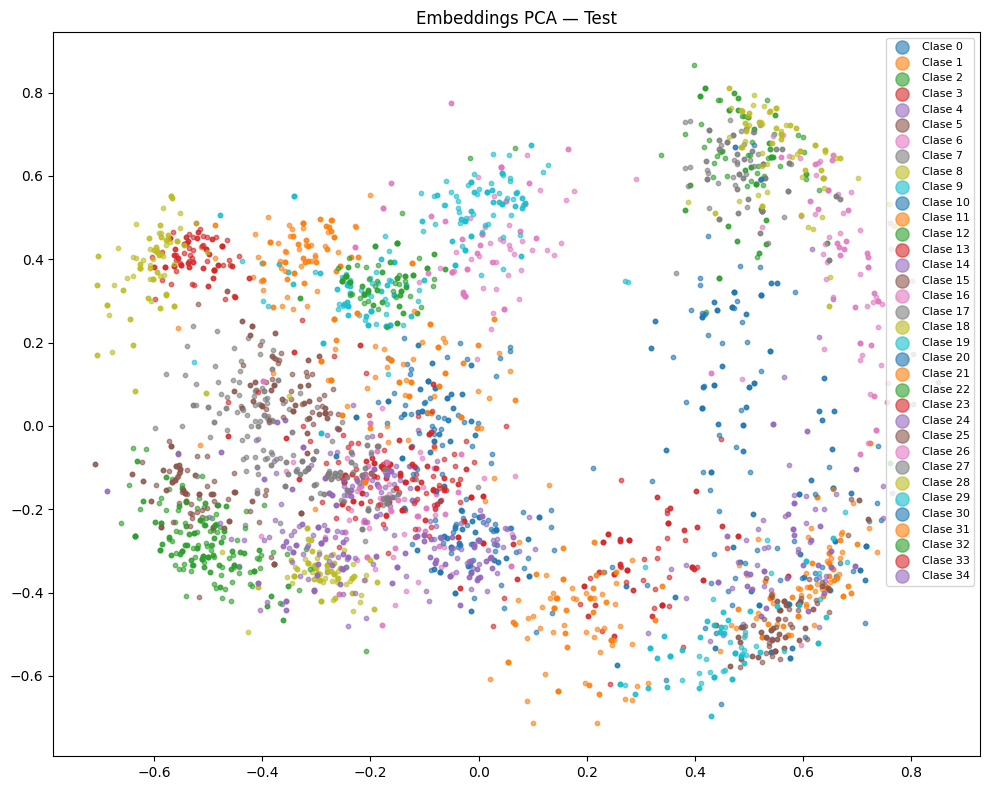

→ Entrenando clasificador k-NN en el espacio de embeddings...
📈 Accuracy (k=5): 0.9110

📊 Reporte por clase (resumen):
              precision    recall  f1-score   support

           0       0.87      0.83      0.85       104
           1       0.72      0.80      0.75       104
           2       0.76      0.85      0.80       104
           3       0.95      0.95      0.95       104
           4       0.90      0.85      0.87       104
           5       0.80      0.87      0.83       104
           6       0.84      0.93      0.89       104
           7       0.89      0.89      0.89       104
           8       0.85      0.56      0.67       104
           9       0.92      0.88      0.90       104
          10       0.89      0.91      0.90       104
          11       0.96      0.99      0.98       104
          12       0.56      0.72      0.63       104
          13       0.93      0.95      0.94       104
          14       0.93      0.88      0.91       104
          15    

0.910989010989011

In [ ]:
# Cargar modelo y pesos entrenados
model = SiameseNet(embedding_dim=128)
model.load_state_dict(torch.load("best_siamese.pt", map_location="cpu"))

# Evaluar en el conjunto de test
test_siamese(
    model=model,
    datamodule=dm,
    visualize_method="pca",   # o "tsne"
    k=5
)


# **5. Llevando el embedding a un modelo de clasificación.**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ClassifierNet(nn.Module):
    """
    Red de clasificación basada en un modelo siamesa preentrenado.
    Congela el backbone + embedding, y añade nuevas capas FC con ReLU.
    """

    def __init__(self, siamese_model, num_classes, hidden_dim=256, freeze_backbone=True):
        super(ClassifierNet, self).__init__()

        # --- Reutiliza el modelo siamesa ---
        self.backbone = siamese_model.backbone
        self.embedding = siamese_model.embedding

        # --- Congelar pesos del modelo base ---
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False
            for param in self.embedding.parameters():
                param.requires_grad = False
            print("Pesos del backbone y embedding congelados.")

        # --- Nueva cabecera de clasificación ---
        # (Se puede ajustar hidden_dim para controlar la capacidad)
        embedding_dim = list(self.embedding.modules())[-1].num_features

        self.classifier_head = nn.Sequential(
            nn.Linear(embedding_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, num_classes)
        )

        # Inicialización de pesos FC
        for m in self.classifier_head.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        feats = self.backbone(x)
        emb = self.embedding(feats)
        emb = F.normalize(emb, p=2, dim=1)

        # Nueva capa entrenable
        logits = self.classifier_head(emb)
        return logits


### **Entrenamiento del modelo**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import f1_score
import numpy as np
from tqdm import tqdm

def train_classifier(
    model,
    datamodule,
    device=None,
    epochs=30,
    lr=1e-4,
    patience=6,
    save_path="best_classifier_f1.pt",
    f1_average="macro"
):
    """
    Entrena un modelo de clasificación (ClassifierNet) usando PyTorch,
    guardando el mejor modelo según F1-score y aplicando early stopping.
    """

    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    print(f"🚀 Entrenando en: {device}")

    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)

    best_f1 = 0.0
    epochs_no_improve = 0

    for epoch in range(1, epochs + 1):
        # ========================
        # 🔹 Entrenamiento
        # ========================
        model.train()
        total_loss, correct, total = 0.0, 0, 0

        for imgs, labels in tqdm(datamodule.train_dataloader(), desc=f"Época {epoch}/{epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss = total_loss / len(datamodule.train_dataloader())
        train_acc = correct / total

        # ========================
        # Validación
        # ========================
        model.eval()
        val_loss, correct, total = 0.0, 0, 0
        all_preds, all_labels = [], []

        with torch.no_grad():
            for imgs, labels in datamodule.val_dataloader():
                imgs, labels = imgs.to(device), labels.to(device)
                outputs = model(imgs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                preds = outputs.argmax(1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        val_loss /= len(datamodule.val_dataloader())
        val_acc = np.mean(np.array(all_preds) == np.array(all_labels))
        val_f1 = f1_score(all_labels, all_preds, average=f1_average)

        # ========================
        # Resultados
        # ========================
        print(f"📘 Epoch [{epoch}/{epochs}] "
              f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f}")

        # ========================
        # 💾 Guardar mejor modelo
        # ========================
        if val_f1 > best_f1:
            best_f1 = val_f1
            epochs_no_improve = 0
            torch.save(model.state_dict(), save_path)
            print(f"✅ Nuevo mejor modelo guardado (F1={best_f1:.4f}) → {save_path}")
        else:
            epochs_no_improve += 1
            print(f"⚠️ Sin mejora de F1 por {epochs_no_improve} épocas consecutivas.")

        # ========================
        # ⏹️ Early Stopping
        # ========================
        if epochs_no_improve >= patience:
            print(f"🛑 Early stopping activado tras {patience} épocas sin mejora.")
            break
    print(f"🏁 Entrenamiento finalizado. Mejor F1: {best_f1:.4f}")


In [ ]:
import torch
torch.cuda.empty_cache()
torch.cuda.ipc_collect()
print("🧹 Caché de CUDA liberada correctamente.")

🧹 Caché de CUDA liberada correctamente.


In [ ]:
# Cargar el modelo siamesa y crear el clasificador
siamese = SiameseNet(embedding_dim=128)
siamese.load_state_dict(torch.load("best_siamese.pt", map_location="cpu"))
siamese.eval()

num_classes = len(dm.train_dataset.classes)
clf_model = ClassifierNet(siamese_model=siamese, num_classes=num_classes, freeze_backbone=True)

# Entrenar
train_classifier(
    model=clf_model,
    datamodule=dm,
    epochs=20,
    lr=1e-4,
    patience=6,          # Early stopping después de 6 sin mejora
    save_path="best_classifier_f1.pt",
    f1_average="macro"   # "weighted" si las clases están desbalanceadas
)


Pesos del backbone y embedding congelados.
🚀 Entrenando en: cuda


Época 1/10: 100%|██████████| 184/184 [00:32<00:00,  5.68it/s]


📘 Epoch [1/10] Train Loss: 3.4979 | Train Acc: 0.0793 | Val Loss: 3.3851 | Val Acc: 0.3171 | Val F1: 0.2543
✅ Nuevo mejor modelo guardado (F1=0.2543) → best_classifier_f1.pt


Época 2/10: 100%|██████████| 184/184 [00:34<00:00,  5.34it/s]


📘 Epoch [2/10] Train Loss: 3.3591 | Train Acc: 0.2320 | Val Loss: 3.2031 | Val Acc: 0.5114 | Val F1: 0.4395
✅ Nuevo mejor modelo guardado (F1=0.4395) → best_classifier_f1.pt


Época 3/10: 100%|██████████| 184/184 [00:33<00:00,  5.55it/s]


📘 Epoch [3/10] Train Loss: 3.2171 | Train Acc: 0.3469 | Val Loss: 3.0161 | Val Acc: 0.6457 | Val F1: 0.5959
✅ Nuevo mejor modelo guardado (F1=0.5959) → best_classifier_f1.pt


Época 4/10: 100%|██████████| 184/184 [00:33<00:00,  5.46it/s]


📘 Epoch [4/10] Train Loss: 3.0524 | Train Acc: 0.4483 | Val Loss: 2.8137 | Val Acc: 0.6914 | Val F1: 0.6503
✅ Nuevo mejor modelo guardado (F1=0.6503) → best_classifier_f1.pt


Época 5/10: 100%|██████████| 184/184 [00:33<00:00,  5.57it/s]


📘 Epoch [5/10] Train Loss: 2.8944 | Train Acc: 0.4707 | Val Loss: 2.5965 | Val Acc: 0.7400 | Val F1: 0.7182
✅ Nuevo mejor modelo guardado (F1=0.7182) → best_classifier_f1.pt


Época 6/10: 100%|██████████| 184/184 [00:33<00:00,  5.56it/s]


📘 Epoch [6/10] Train Loss: 2.7137 | Train Acc: 0.5194 | Val Loss: 2.3614 | Val Acc: 0.8014 | Val F1: 0.7846
✅ Nuevo mejor modelo guardado (F1=0.7846) → best_classifier_f1.pt


Época 7/10: 100%|██████████| 184/184 [00:32<00:00,  5.58it/s]


📘 Epoch [7/10] Train Loss: 2.5600 | Train Acc: 0.5163 | Val Loss: 2.1561 | Val Acc: 0.7986 | Val F1: 0.7832
⚠️ Sin mejora de F1 por 1 épocas consecutivas.


Época 8/10: 100%|██████████| 184/184 [00:33<00:00,  5.44it/s]


📘 Epoch [8/10] Train Loss: 2.3631 | Train Acc: 0.5636 | Val Loss: 1.9410 | Val Acc: 0.8186 | Val F1: 0.8053
✅ Nuevo mejor modelo guardado (F1=0.8053) → best_classifier_f1.pt


Época 9/10: 100%|██████████| 184/184 [00:33<00:00,  5.57it/s]


📘 Epoch [9/10] Train Loss: 2.2092 | Train Acc: 0.5738 | Val Loss: 1.7470 | Val Acc: 0.8214 | Val F1: 0.8085
✅ Nuevo mejor modelo guardado (F1=0.8085) → best_classifier_f1.pt


Época 10/10: 100%|██████████| 184/184 [00:33<00:00,  5.55it/s]


📘 Epoch [10/10] Train Loss: 2.0473 | Train Acc: 0.5908 | Val Loss: 1.5697 | Val Acc: 0.8329 | Val F1: 0.8181
✅ Nuevo mejor modelo guardado (F1=0.8181) → best_classifier_f1.pt
🏁 Entrenamiento finalizado. Mejor F1: 0.8181


In [ ]:
#clf_model.load_state_dict(torch.load("best_classifier_f1.pt", map_location="cpu"))


<All keys matched successfully>

In [ ]:
# Entrenar
#train_classifier(
#    model=clf_model,
#    datamodule=dm,
#    epochs=5,
#    lr=1e-4,
#    patience=6,          # Early stopping después de 6 sin mejora
#    save_path="best_classifier_f1.pt",
#    f1_average="macro"   # "weighted" si las clases están desbalanceadas
#)

🚀 Entrenando en: cuda


Época 1/5: 100%|██████████| 184/184 [00:33<00:00,  5.54it/s]


📘 Epoch [1/5] Train Loss: 1.9324 | Train Acc: 0.5895 | Val Loss: 1.4067 | Val Acc: 0.8514 | Val F1: 0.8361
✅ Nuevo mejor modelo guardado (F1=0.8361) → best_classifier_f1.pt


Época 2/5: 100%|██████████| 184/184 [00:36<00:00,  5.01it/s]


📘 Epoch [2/5] Train Loss: 1.8267 | Train Acc: 0.6044 | Val Loss: 1.2904 | Val Acc: 0.8414 | Val F1: 0.8276
⚠️ Sin mejora de F1 por 1 épocas consecutivas.


Época 3/5: 100%|██████████| 184/184 [00:33<00:00,  5.55it/s]


📘 Epoch [3/5] Train Loss: 1.7303 | Train Acc: 0.6027 | Val Loss: 1.1865 | Val Acc: 0.8357 | Val F1: 0.8192
⚠️ Sin mejora de F1 por 2 épocas consecutivas.


Época 4/5: 100%|██████████| 184/184 [00:33<00:00,  5.54it/s]


📘 Epoch [4/5] Train Loss: 1.6385 | Train Acc: 0.6058 | Val Loss: 1.0942 | Val Acc: 0.8400 | Val F1: 0.8244
⚠️ Sin mejora de F1 por 3 épocas consecutivas.


Época 5/5: 100%|██████████| 184/184 [00:33<00:00,  5.50it/s]


📘 Epoch [5/5] Train Loss: 1.5741 | Train Acc: 0.6201 | Val Loss: 1.0192 | Val Acc: 0.8314 | Val F1: 0.8156
⚠️ Sin mejora de F1 por 4 épocas consecutivas.
🏁 Entrenamiento finalizado. Mejor F1: 0.8361


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, f1_score
import seaborn as sns

def test_classifier(model, datamodule, device=None, class_names=None, max_misclassified=12):
    """
    Evalúa el modelo de clasificación (ClassifierNet) y muestra:
      - Accuracy y F1-score
      - Matriz de confusión
      - Reporte de clasificación
      - Ejemplos de imágenes mal clasificadas
    """

    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    all_preds, all_labels = [], []
    misclassified = []

    with torch.no_grad():
        for imgs, labels in datamodule.test_dataloader():
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            # Guardar imágenes mal clasificadas
            mismatched = preds != labels
            for i in range(len(imgs)):
                if mismatched[i]:
                    misclassified.append((
                        imgs[i].cpu(),
                        preds[i].item(),
                        labels[i].item()
                    ))

    # ========================
    # 📊 Métricas globales
    # ========================
    all_preds, all_labels = np.array(all_preds), np.array(all_labels)
    acc = np.mean(all_preds == all_labels)
    f1 = f1_score(all_labels, all_preds, average="macro")
    print(f"🎯 Test Accuracy: {acc:.4f} | F1 (macro): {f1:.4f}")

    # ========================
    # 🧾 Reporte de clasificación
    # ========================
    if class_names is None:
        try:
            class_names = datamodule.train_dataset.classes
        except:
            class_names = [str(i) for i in np.unique(all_labels)]

    print("\n📋 Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names, zero_division=0))

    # ========================
    # 🔢 Matriz de confusión
    # ========================
    cm = confusion_matrix(all_labels, all_preds, normalize="true")
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=False, cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.title("Matriz de Confusión (normalizada)")
    plt.xlabel("Predicción")
    plt.ylabel("Real")
    plt.tight_layout()
    plt.show()

    # ========================
    # 🖼️ Visualizar errores
    # ========================
    n_show = min(len(misclassified), max_misclassified)
    if n_show > 0:
        print(f"\n❌ Mostrando {n_show} ejemplos mal clasificados:")

        n_cols = 4
        n_rows = int(np.ceil(n_show / n_cols))
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3 * n_rows))
        axes = axes.flatten()

        for i, (img, pred, true) in enumerate(misclassified[:n_show]):
            img = img.permute(1, 2, 0).numpy()
            img = np.clip(img, 0, 1)
            axes[i].imshow(img)
            axes[i].set_title(f"Pred: {class_names[pred]}\nReal: {class_names[true]}", fontsize=9)
            axes[i].axis("off")

        for j in range(i + 1, len(axes)):
            axes[j].axis("off")

        plt.tight_layout()
        plt.show()
    else:
        print("✅ No se encontraron errores de clasificación.")


🎯 Test Accuracy: 0.8473 | F1 (macro): 0.8342

📋 Classification Report:
               precision    recall  f1-score   support

   Abyssinian       0.95      0.59      0.73       104
       Bengal       0.55      0.54      0.55       104
       Birman       0.50      0.97      0.66       104
       Bombay       0.89      1.00      0.94       104
      British       0.75      0.77      0.76       104
     Egyptian       0.63      0.90      0.74       104
        Maine       0.86      0.66      0.75       104
      Persian       0.66      0.97      0.79       104
      Ragdoll       0.00      0.00      0.00       104
      Russian       0.89      0.74      0.81       104
      Siamese       0.98      0.78      0.87       104
       Sphynx       0.97      0.98      0.98       104
     american       0.50      0.29      0.37       104
       basset       0.87      0.90      0.89       104
       beagle       0.88      0.84      0.86       104
        boxer       0.58      1.00      0.73    

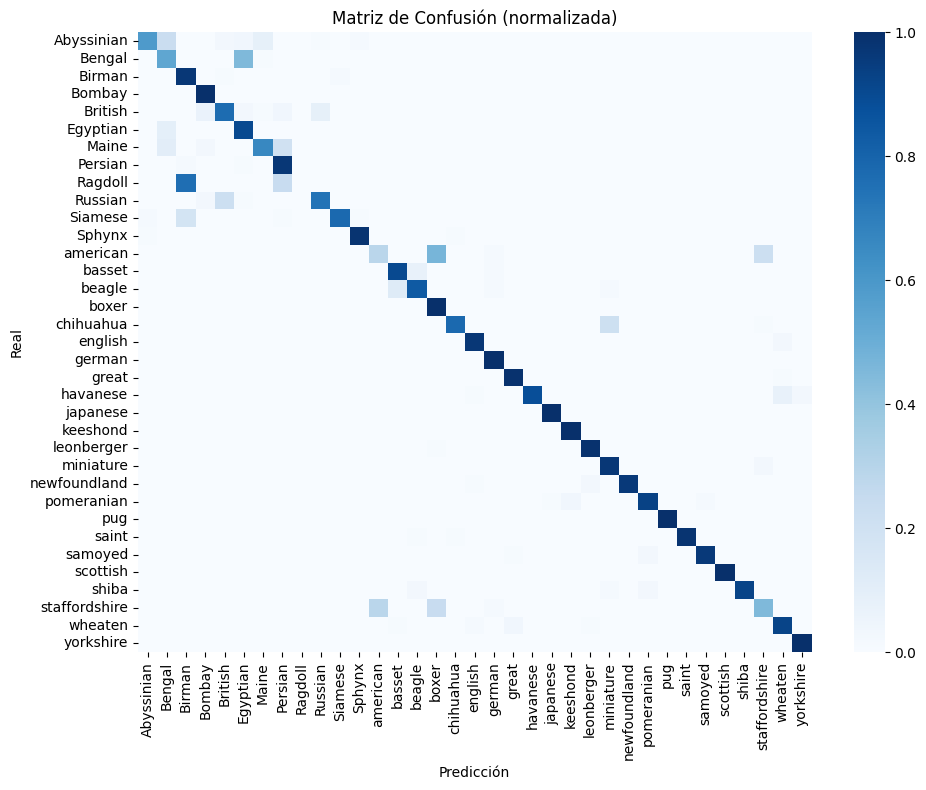


❌ Mostrando 12 ejemplos mal clasificados:


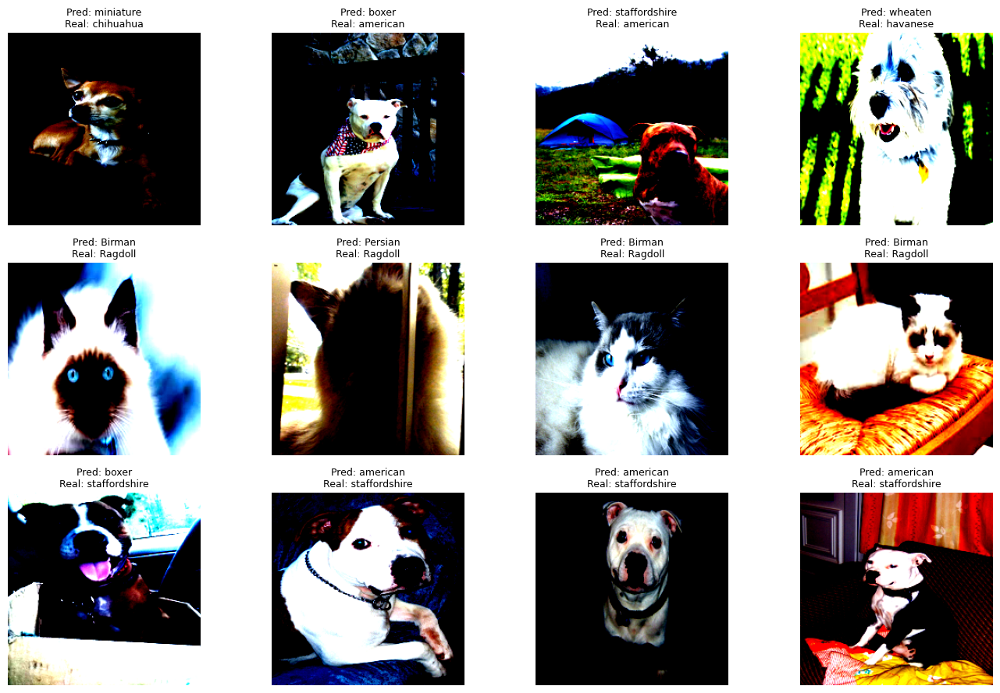

In [ ]:
# Cargar el mejor modelo guardado
clf_model.load_state_dict(torch.load("best_classifier_f1.pt", map_location="cpu"))

# Evaluar
test_classifier(
    model=clf_model,
    datamodule=dm,
    class_names=dm.train_dataset.classes,  # opcional
    max_misclassified=12
)
